# Ireland Property Price Register (PPR)

The Ireland PPR is a comprehensive dataset maintained by the Property Services Regulatory Authority (PSRA) and contains information on all property sales transaction that have been registered in Ireland since 2010.

The dataset is public and can be found on the official PSRA website: [Residential Property Price Register](https://www.propertypriceregister.ie/website/npsra/pprweb.nsf/page/ppr-home-en)  

It is made available year wise and is updated regularly. I downloaded the individual files for every year from 2010 and merged it into one common dataset.

# Data Preprocessing

## Merging

In [50]:
import os
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from datetime import datetime

In [2]:
df_list = []
for year in range(2010,2024):
    filename = f'PPR-{year}.csv'
    df = pd.read_csv(filename, encoding = "ISO-8859-1") # Had to use encoding for Euro symbol
    df_list.append(df)
df = pd.concat(df_list, axis=0) # Merges on columns

In [4]:
df.head()

,Date of Sale (dd/mm/yyyy),Address,County,Eircode,Price (),Not Full Market Price,VAT Exclusive,Description of Property,Property Size Description
0,01/01/2010,"5 Braemor Drive, Churchtown, Co.Dublin",Dublin,NaN,"343,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
1,03/01/2010,"134 Ashewood Walk, Summerhill Lane, Portlaoise",Laois,NaN,"185,000.00",No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...
2,04/01/2010,"1 Meadow Avenue, Dundrum, Dublin 14",Dublin,NaN,"438,500.00",No,No,Second-Hand Dwelling house /Apartment,NaN
3,04/01/2010,"1 The Haven, Mornington",Meath,NaN,"400,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
4,04/01/2010,"11 Melville Heights, Kilkenny",Kilkenny,NaN,"160,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN


In [5]:
# Save the merged dataset
df.to_csv('PPR-2010-2023.csv',index=False)

In [19]:
df = pd.read_csv('PPR-2010-2023.csv')

/var/folders/55/j0v2zlbn1575rkmztsycxlfw0000gn/T/ipykernel_24775/3239213054.py:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('PPR-2010-2023.csv')


In [20]:
# Unique values in Property Size description
df['Property Size Description'].unique()

array([nan,
       'greater than or equal to 38 sq metres and less than 125 sq metres',
       'greater than 125 sq metres', 'less than 38 sq metres',
       'greater than or equal to 125 sq metres',
       'níos mó ná nó cothrom le 38 méadar cearnach agus níos lú ná 125 méadar cearnach',
       'n?os l? n? 38 m?adar cearnach'], dtype=object)

These values are very vague and does not provide any significance value to the dataset.

In [21]:
# Checking how many rows/houses have the Eircode data
df[dataset['Eircode'].notna()]

,Date of Sale (dd/mm/yyyy),Address,County,Eircode,Price (),Not Full Market Price,VAT Exclusive,Description of Property,Property Size Description
73089,24/05/2013,"70 CHARLESTOWN PARK, ST MARGARETS RD, DUBLIN 11",Dublin,D11TX45,"216,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
74788,17/06/2013,"CASTLENUGENT, LISRYAN, CO. LONGFORD",Longford,N39TP27,"35,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
75132,21/06/2013,"15 ROWAN TERRACE, NEWBRIDGE, KILDARE",Kildare,W12FX56,"120,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
75941,28/06/2013,"MONEEN, WILLIAMSTOWN, CO GALWAY",Galway,F45CX85,"13,750.00",Yes,No,Second-Hand Dwelling house /Apartment,NaN
84319,03/10/2013,"55 HARRISONS PLACE, CHALEVILLE, CORK",Cork,P56PN22,"30,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
...,...,...,...,...,...,...,...,...,...
589017,16/03/2023,"CRAGBEG, CLARINA, LIMERICK",Limerick,V94NFT9,"76,000.00",Yes,No,Second-Hand Dwelling house /Apartment,NaN
589019,16/03/2023,"NO 1 PRIORY HALL, BALLAGHADERREEN, CO ROSCOMMON",Roscommon,F45Y029,"135,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
589020,16/03/2023,"RAMPARK, JENKINSTOWN, DUNDALK",Louth,A91CD86,"305,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
589021,16/03/2023,"ROSSNAPARTEN, LOW ROAD SHROOVE, GREENCASTLE",Donegal,F93NVW5,"430,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN


In [22]:
df.shape

(589024, 9)

Only 85967 rows from 589024 rows have the Eircode data. That is about $\approx 14.6\%$ of the rows, so I have decided to drop the Eircode column.

In [23]:
# Checking if all counties are present
print(df['County'].unique())
print(f"{len(df['County'].unique())} Counties present")

['Dublin' 'Laois' 'Meath' 'Kilkenny' 'Limerick' 'Carlow' 'Cork' 'Clare'
 'Sligo' 'Cavan' 'Tipperary' 'Wicklow' 'Roscommon' 'Wexford' 'Mayo'
 'Donegal' 'Longford' 'Galway' 'Offaly' 'Kildare' 'Waterford' 'Louth'
 'Kerry' 'Westmeath' 'Monaghan' 'Leitrim']
26 Counties present


## Cleaning

In [24]:
df.columns

Index(['Date of Sale (dd/mm/yyyy)', 'Address', 'County', 'Eircode',
       'Price ()', 'Not Full Market Price', 'VAT Exclusive',
       'Description of Property', 'Property Size Description'],
      dtype='object')

In [28]:
l = []
for column in df.columns:
    l.append(len(df[df[column].isna()]))
print("Count of NA values in each column")    
for i in range (len(df.columns)):
    print(f"{df.columns[i]} = {l[i]}")

Count of NA values in each column
Date of Sale (dd/mm/yyyy) = 0
Address = 0
County = 0
Eircode = 503057
Price () = 0
Not Full Market Price = 0
VAT Exclusive = 0
Description of Property = 0
Property Size Description = 536210


In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 589024 entries, 0 to 589023
Data columns (total 9 columns):
 #   Column                     Non-Null Count   Dtype 
---  ------                     --------------   ----- 
 0   Date of Sale (dd/mm/yyyy)  589024 non-null  object
 1   Address                    589024 non-null  object
 2   County                     589024 non-null  object
 3   Eircode                    85967 non-null   object
 4   Price ()                  589024 non-null  object
 5   Not Full Market Price      589024 non-null  object
 6   VAT Exclusive              589024 non-null  object
 7   Description of Property    589024 non-null  object
 8   Property Size Description  52814 non-null   object
dtypes: object(9)
memory usage: 40.4+ MB


Eircode and Property Size description have a lot of NA values so dropping those columns

In [31]:
df = df.drop('Property Size Description', axis=1)
df = df.drop('Eircode',axis=1)

In [32]:
# Removing the Euro symbol from the Price column

def clean_price(string):
    string = string.replace(",","")
    return float(string[1:])
Price = df['Price ()'].apply(clean_price)

df = df.drop('Price ()',axis=1)

df['Price'] = Price

In [33]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 589024 entries, 0 to 589023
Data columns (total 7 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   Date of Sale (dd/mm/yyyy)  589024 non-null  object 
 1   Address                    589024 non-null  object 
 2   County                     589024 non-null  object 
 3   Not Full Market Price      589024 non-null  object 
 4   VAT Exclusive              589024 non-null  object 
 5   Description of Property    589024 non-null  object 
 6   Price                      589024 non-null  float64
dtypes: float64(1), object(6)
memory usage: 31.5+ MB


In [34]:
df["VAT Exclusive"].value_counts()

VAT Exclusive
No     494042
Yes     94982
Name: count, dtype: int64

In [39]:
df.rename(columns = {"Date of Sale (dd/mm/yyyy)":"Date"},inplace=True)

In [35]:
df['Description of Property'].unique()

array(['Second-Hand Dwelling house /Apartment',
       'New Dwelling house /Apartment', 'Teach/Árasán Cónaithe Atháimhe',
       'Teach/Árasán Cónaithe Nua', 'Teach/?ras?n C?naithe Nua'],
      dtype=object)

Translations of the unique values of Description.

'Teach/Árasán Cónaithe Atháimhe' = 'Second hand House/Apartment'  

'Teach/Árasán Cónaithe Nua' = 'New House/Apartment'  

'Teach/?ras?n C?naithe Nua' = 'New House/Apartment'  

'New Dwelling house /Apartment' = 'New House/Apartment'  

'Second-Hand Dwelling house /Apartment' = 'Second Hand House/Apartment'

Replacing these with New or Second-Hand.

In [36]:
replacement_dict = {
    'Second-Hand Dwelling house /Apartment':'Second-Hand',
    'New Dwelling house /Apartment':'New',
    'Teach/Árasán Cónaithe Atháimhe':'Second-Hand',
    'Teach/Árasán Cónaithe Nua':'New',
    'Teach/?ras?n C?naithe Nua':'New'
}

df['Description of Property'] = df['Description of Property'].replace(replacement_dict)

In [40]:
df.head()

,Date,Address,County,Not Full Market Price,VAT Exclusive,Description of Property,Price
0,01/01/2010,"5 Braemor Drive, Churchtown, Co.Dublin",Dublin,No,No,Second-Hand,343000.0
1,03/01/2010,"134 Ashewood Walk, Summerhill Lane, Portlaoise",Laois,No,Yes,New,185000.0
2,04/01/2010,"1 Meadow Avenue, Dundrum, Dublin 14",Dublin,No,No,Second-Hand,438500.0
3,04/01/2010,"1 The Haven, Mornington",Meath,No,No,Second-Hand,400000.0
4,04/01/2010,"11 Melville Heights, Kilkenny",Kilkenny,No,No,Second-Hand,160000.0


In [42]:
# Rearranging columns

df = df[['Date','Address',
            'County','Price',
            'Not Full Market Price','VAT Exclusive',
            'Description of Property']]

### Cleaning the Address column 

Removing the county name from address column

In [43]:
address = df['Address']

In [44]:
address[0].split(',')[-1]

' Co.Dublin'

In [45]:
for i in range(10):
    display(df['Address'].loc[i])

'5 Braemor Drive, Churchtown, Co.Dublin'

'134 Ashewood Walk, Summerhill Lane, Portlaoise'

'1 Meadow Avenue, Dundrum, Dublin 14'

'1 The Haven, Mornington'

'11 Melville Heights, Kilkenny'

'12 Sallymount Avenue, Ranelagh'

'13  Oakleigh Wood, Dooradoyle, Limerick'

'13 The Drive, Chapelstown Gate, Tullow Road'

'15 Carriglawn, Waterpark, Carrigaline'

'15a Moore Bay, Kilkee'

In [46]:
# Playing with strings

df['Address'].loc[0].split(',')[:-1][-1].strip()

'Churchtown'

In [47]:
df['Address'].loc[0].split(',')[-1][1:].split(" ")[-1].split('.')[-1].lower()

'dublin'

In [48]:
df['Address'].loc[4].split(',')[-1][1:].split(" ")[-1].split('.')[-1].lower()

'kilkenny'

In [51]:
# Extracting town names from the Address column.
# The town names are at the second last position if county names are not present

Town = []
for i in range(len(df)):
    if df['Address'].loc[i].split(',')[-1][1:].split(" ")[-1].split('.')[-1].lower() == df['County'].loc[i].lower():
        if any(char.isdigit() for char in df['Address'].loc[i].split(',')[-2].strip()):
            string = re.sub(r"\d+","", df['Address'].loc[i].split(',')[-2].strip())
            Town.append(string.lower())
        else:
            Town.append(df['Address'].loc[i].split(',')[-2].strip().lower())
    else:
        Town.append(df['Address'].loc[i].split(',')[-1].strip().lower())

In [52]:
df['Town'] = Town

In [53]:
df.head()

,Date,Address,County,Price,Not Full Market Price,VAT Exclusive,Description of Property,Town
0,01/01/2010,"5 Braemor Drive, Churchtown, Co.Dublin",Dublin,343000.0,No,No,Second-Hand,churchtown
1,03/01/2010,"134 Ashewood Walk, Summerhill Lane, Portlaoise",Laois,185000.0,No,Yes,New,portlaoise
2,04/01/2010,"1 Meadow Avenue, Dundrum, Dublin 14",Dublin,438500.0,No,No,Second-Hand,dublin 14
3,04/01/2010,"1 The Haven, Mornington",Meath,400000.0,No,No,Second-Hand,mornington
4,04/01/2010,"11 Melville Heights, Kilkenny",Kilkenny,160000.0,No,No,Second-Hand,melville heights


In [54]:
# The most expensive property sold in Dublin 15
d15 = df[df['Town'] == 'dublin 15']
d15.loc[d15['Price'].idxmax()]

Date                                                              29/10/2020
Address                    1-46 Royal Canal Crescent, Rathborne Park, Dub...
County                                                                Dublin
Price                                                            16308370.05
Not Full Market Price                                                     No
VAT Exclusive                                                            Yes
Description of Property                                                  New
Town                                                               dublin 15
Name: 444703, dtype: object

In [57]:
# The most expensive property ever sold in Ireland according to PPR
df.loc[df['Price'].idxmax()]

Date                                                     10/02/2023
Address                    O'Devaney Gardens, Arbour Hill, Dublin 7
County                                                       Dublin
Price                                                   225000000.0
Not Full Market Price                                           Yes
VAT Exclusive                                                   Yes
Description of Property                                         New
Town                                                       dublin 7
Name: 585087, dtype: object

In [59]:
# Reorganizing
df_cleaned = df[['Date','Town','County',
                    'Price','Not Full Market Price','VAT Exclusive',
                    'Description of Property']]

In [60]:
df_cleaned.to_csv('PPR-cleaned.csv',index=False)

## Exploratory Data Analysis

In [61]:
df = pd.read_csv('PPR-cleaned.csv')
df.head()

,Date,Town,County,Price,Not Full Market Price,VAT Exclusive,Description of Property
0,01/01/2010,churchtown,Dublin,343000.0,No,No,Second-Hand
1,03/01/2010,portlaoise,Laois,185000.0,No,Yes,New
2,04/01/2010,dublin 14,Dublin,438500.0,No,No,Second-Hand
3,04/01/2010,mornington,Meath,400000.0,No,No,Second-Hand
4,04/01/2010,melville heights,Kilkenny,160000.0,No,No,Second-Hand


In [66]:
df['Date'] = pd.to_datetime(df['Date'],format='mixed')

In [68]:
df.head()

,Date,Town,County,Price,Not Full Market Price,VAT Exclusive,Description of Property
0,2010-01-01,churchtown,Dublin,343000.0,No,No,Second-Hand
1,2010-03-01,portlaoise,Laois,185000.0,No,Yes,New
2,2010-04-01,dublin 14,Dublin,438500.0,No,No,Second-Hand
3,2010-04-01,mornington,Meath,400000.0,No,No,Second-Hand
4,2010-04-01,melville heights,Kilkenny,160000.0,No,No,Second-Hand


In [69]:
df.Town.value_counts()

Town
dublin 15                   7276
dundalk                     5745
drogheda                    5638
lucan                       5489
swords                      5150
                            ... 
 kilbrittain village           1
loyola park                    1
 michael fitzgerald road       1
louth end                      1
sweetman rd                    1
Name: count, Length: 26575, dtype: int64

In [70]:
# The names of some towns have the word 'road' or 'rd' but its the same thing.
# Replacing road with rd to keep it consistent

df['Town'] = df['Town'].str.replace(r'\broad\b', 'rd', regex=True)

<Axes: xlabel='Town'>

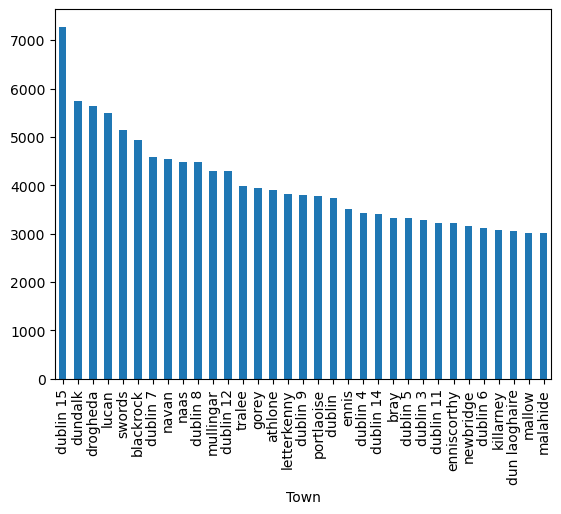

In [71]:
# Plotting bar graph only those towns which have more than 3000 properties registered.
towncount = df.Town.value_counts()
towncount1000 = towncount[towncount>3000]
towncount1000.plot.bar()

In [72]:
# Creating a new column called Province and associating each county with it's province.

county_to_province = {
    'Carlow': 'Leinster',
    'Cavan': 'Ulster',
    'Clare': 'Munster',
    'Cork': 'Munster',
    'Donegal': 'Ulster',
    'Dublin': 'Leinster',
    'Galway': 'Connacht',
    'Kerry': 'Munster',
    'Kildare': 'Leinster',
    'Kilkenny': 'Leinster',
    'Laois': 'Leinster',
    'Leitrim': 'Connacht',
    'Limerick': 'Munster',
    'Longford': 'Leinster',
    'Louth': 'Leinster',
    'Mayo': 'Connacht',
    'Meath': 'Leinster',
    'Monaghan': 'Ulster',
    'Offaly': 'Leinster',
    'Roscommon': 'Connacht',
    'Sligo': 'Connacht',
    'Tipperary': 'Munster',
    'Waterford': 'Munster',
    'Westmeath': 'Leinster',
    'Wexford': 'Leinster',
    'Wicklow': 'Leinster'
}

df['Province'] = df['County'].map(county_to_province)

In [73]:
df.head()

,Date,Town,County,Price,Not Full Market Price,VAT Exclusive,Description of Property,Province
0,2010-01-01,churchtown,Dublin,343000.0,No,No,Second-Hand,Leinster
1,2010-03-01,portlaoise,Laois,185000.0,No,Yes,New,Leinster
2,2010-04-01,dublin 14,Dublin,438500.0,No,No,Second-Hand,Leinster
3,2010-04-01,mornington,Meath,400000.0,No,No,Second-Hand,Leinster
4,2010-04-01,melville heights,Kilkenny,160000.0,No,No,Second-Hand,Leinster


### Province wise number of properties registered

<Axes: xlabel='Province'>

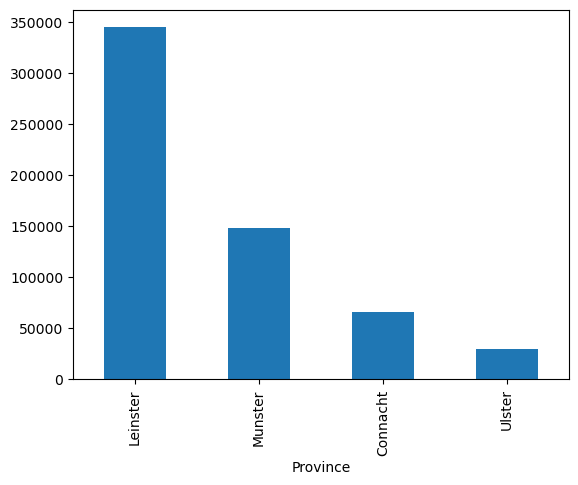

In [74]:
# Determine the distribution of properties province wise.
df.Province.value_counts().plot.bar()

In [75]:
carlowcount = df[df['County'] == "Carlow"].Town.value_counts()
carlowcount[carlowcount > 50]

Town
tullow            819
tullow rd         493
bagenalstown      371
carlow            318
graiguecullen     254
browneshill rd    203
pollerton         181
dublin rd         171
rathvilly         151
borris            138
leighlinbridge    136
kilkenny rd       112
hacketstown       109
quinagh           108
ballon             90
burrin rd          84
blackbog rd        78
fenagh             73
myshall            71
carlow town        61
athy rd            59
hacketstown rd     58
leighlin rd        53
Name: count, dtype: int64

There are areas where the number of properties is very less.

Setting a threshold for minimum number of properties to be including in the dataset.


In [76]:
# Setting a threshold of 200
towncount = df.Town.value_counts()
towncount200 = towncount[towncount > 200]

<Axes: ylabel='Frequency'>

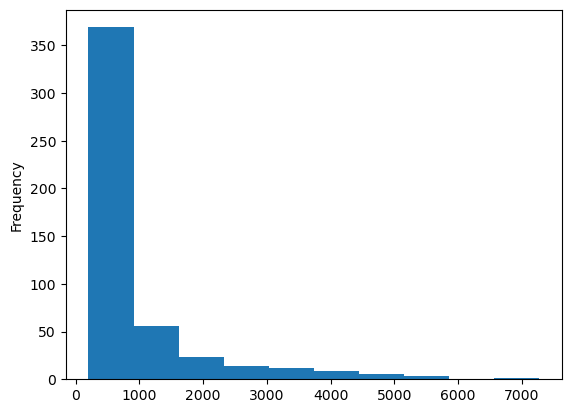

In [77]:
towncount200.plot.hist()

In [79]:
df = df[df['Town'].isin(towncount200.index)]
df.head()

,Date,Town,County,Price,Not Full Market Price,VAT Exclusive,Description of Property,Province
0,2010-01-01,churchtown,Dublin,343000.0,No,No,Second-Hand,Leinster
1,2010-03-01,portlaoise,Laois,185000.0,No,Yes,New,Leinster
2,2010-04-01,dublin 14,Dublin,438500.0,No,No,Second-Hand,Leinster
3,2010-04-01,mornington,Meath,400000.0,No,No,Second-Hand,Leinster
5,2010-04-01,ranelagh,Dublin,425000.0,No,No,Second-Hand,Leinster


In [80]:
# Saving the final cleaned dataset
df.to_csv("PPR-cleaned-v2.csv",index=False)

In [81]:
df = pd.read_csv('PPR-cleaned-v2.csv')
df.head()

,Date,Town,County,Price,Not Full Market Price,VAT Exclusive,Description of Property,Province
0,2010-01-01,churchtown,Dublin,343000.0,No,No,Second-Hand,Leinster
1,2010-03-01,portlaoise,Laois,185000.0,No,Yes,New,Leinster
2,2010-04-01,dublin 14,Dublin,438500.0,No,No,Second-Hand,Leinster
3,2010-04-01,mornington,Meath,400000.0,No,No,Second-Hand,Leinster
4,2010-04-01,ranelagh,Dublin,425000.0,No,No,Second-Hand,Leinster


In [82]:
df['Date'] = pd.to_datetime(df['Date'], infer_datetime_format=True)

/var/folders/55/j0v2zlbn1575rkmztsycxlfw0000gn/T/ipykernel_24775/1987004002.py:1: UserWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  df['Date'] = pd.to_datetime(df['Date'], infer_datetime_format=True)


In [83]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 427849 entries, 0 to 427848
Data columns (total 8 columns):
 #   Column                   Non-Null Count   Dtype         
---  ------                   --------------   -----         
 0   Date                     427849 non-null  datetime64[ns]
 1   Town                     427849 non-null  object        
 2   County                   427849 non-null  object        
 3   Price                    427849 non-null  float64       
 4   Not Full Market Price    427849 non-null  object        
 5   VAT Exclusive            427849 non-null  object        
 6   Description of Property  427849 non-null  object        
 7   Province                 427849 non-null  object        
dtypes: datetime64[ns](1), float64(1), object(6)
memory usage: 26.1+ MB


In [84]:
Dublin = df[df['County']=='Dublin']
Dublin

,Date,Town,County,Price,Not Full Market Price,VAT Exclusive,Description of Property,Province
0,2010-01-01,churchtown,Dublin,343000.0,No,No,Second-Hand,Leinster
2,2010-04-01,dublin 14,Dublin,438500.0,No,No,Second-Hand,Leinster
4,2010-04-01,ranelagh,Dublin,425000.0,No,No,Second-Hand,Leinster
9,2010-04-01,dublin 3,Dublin,430000.0,No,No,Second-Hand,Leinster
10,2010-04-01,dublin 15,Dublin,355000.0,No,No,Second-Hand,Leinster
...,...,...,...,...,...,...,...,...
427831,2023-03-16,dublin 7,Dublin,731000.0,No,No,Second-Hand,Leinster
427832,2023-03-16,kinsealy,Dublin,340000.0,No,No,Second-Hand,Leinster
427838,2023-03-16,dublin 15,Dublin,336000.0,No,No,Second-Hand,Leinster
427840,2023-03-16,clontarf dublin 3,Dublin,300000.0,No,No,Second-Hand,Leinster


In [87]:
# Considering only those towns in dublin which have more than 500 houses
Dublin500 = Dublin.Town.value_counts()[Dublin.Town.value_counts() > 500]
Dublin500 = Dublin[Dublin['Town'].isin(Dublin500.index)]
Dublin500.head()

,Date,Town,County,Price,Not Full Market Price,VAT Exclusive,Description of Property,Province
2,2010-04-01,dublin 14,Dublin,438500.0,No,No,Second-Hand,Leinster
9,2010-04-01,dublin 3,Dublin,430000.0,No,No,Second-Hand,Leinster
10,2010-04-01,dublin 15,Dublin,355000.0,No,No,Second-Hand,Leinster
13,2010-04-01,blackrock,Dublin,547500.0,No,No,Second-Hand,Leinster
14,2010-04-01,dublin 4,Dublin,700000.0,No,No,Second-Hand,Leinster


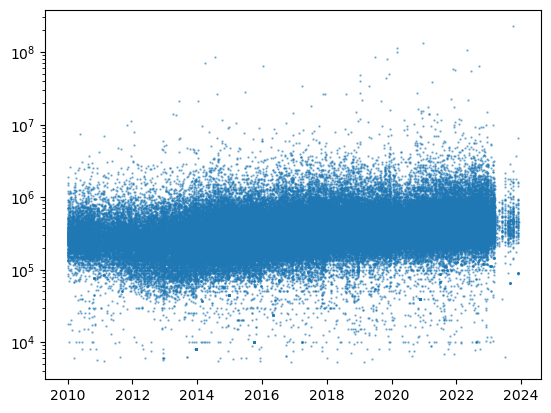

In [88]:
fig, ax = plt.subplots()

ax.scatter(Dublin500['Date'],Dublin500['Price'],s=0.5,alpha=0.5)
ax.set_yscale('log')

### Scatter plot of property price vs date of sale in Dublin 

In [89]:
fig = px.scatter(Dublin500, x='Date',y='Price', color='Town',log_y=True,
                 trendline="ols", trendline_scope="overall",trendline_color_override="black",
                 trendline_options=dict(log_y=True))
fig.update_traces(marker=dict(size=2,opacity=0.2))
fig.show()

### Scatter plot of median property price in Irish counties.

In [90]:
# Group the data by county and calculate the mean and median property prices
county_stats = df.groupby('County')['Price'].agg(['median'])

# Print the results
county_stats

,median
County,
Carlow,145000.000
Cavan,119480.575
Clare,143000.000
Cork,210000.000
Donegal,107000.000
Dublin,325000.000
Galway,185000.000
Kerry,150000.000
Kildare,261000.000


In [91]:
fig = px.scatter(county_stats)
fig.show()

# ML Algorithms

In [104]:
# Importing all the required libraries
import os
import re
import sys
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
from datetime import datetime
import matplotlib.pyplot as plt
import plotly.graph_objects as go

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import LabelBinarizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

from sklearn.cluster import KMeans
from sklearn.tree import DecisionTreeRegressor
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor

from sklearn.metrics import r2_score, mean_squared_error

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM

os.environ['TF_CPP_MIN_LOG_LEVEL'] = '1'
#os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'

from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.statespace.sarimax import SARIMAX

## Linear Regression

Linear regression is a statistical approach for modeling the connection between one or more independent variables and a dependent variable. The purpose of linear regression is to find the straight line that best fits a set of data points and minimizes the sum of squared errors between the predicted and actual values of the dependent variable.

The coefficients are estimated using the ordinary least squares method which involves minimizing the sum of squared errors between the predicted and actual values of dependent variables. 

From the above plot of property prices in Dublin, we can observe that there is extreme variation when it comes to property prices over the year. Hence a straight line fit almost looks like a line with 0 slope. This already tells us that linear regression probably is not a good model to predict property prices in our case.

In [94]:
# Load the data and select relevant columns
df = pd.read_csv('PPR-cleaned-v2.csv')
df = df[['Price', 'County', 'Description of Property', 'Province']]

# Handle missing values and outliers
df = df.dropna() # Drop rows with missing values
df = df[df['Price'] > 0] # Remove rows with zero or negative prices
df = df[df['Price'] < np.percentile(df['Price'], 99)] # Remove top 1% of prices as outliers

# Encode categorical variables using one-hot encoding
df = pd.get_dummies(df, columns=['County', 'Description of Property', 'Province'])

# Split the data into training and test sets
X = df.drop('Price', axis=1)
y = df['Price']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale the numerical variables using standardization
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Train the linear regression model on the training set
lr = LinearRegression()
lr.fit(X_train_scaled, y_train)

# Evaluate the model's performance on the test set
y_pred = lr.predict(X_test_scaled)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print(f'Mean squared error: {mse:.2f}')
print(f'R-squared: {r2:.2f}')

Mean squared error: 25525039838.06
R-squared: 0.25


As we expected that is a very bad R-squared score. It mean that only 25% of variance in price can be explained by the independent variables. This mean that the fit is not good of the linear regression model. And this also hints that we don't have sufficient data to explain the variance in the property price.

## LSTM

LSTM stands for Long Short Term Memory, is a type of Recurrent Neural Network (RNN).

The LSTM architecture consists of three types of gates:

Input gate: This gate controls the flow of new input into the memory cell. It is responsible for deciding which new information should be stored in the cell.

Forget gate: This gate controls the flow of information out of the memory cell. It is responsible for deciding which old information should be forgotten.

Output gate: This gate controls the flow of output from the memory cell to the next hidden state. It is responsible for deciding which information should be outputted.



In [98]:
def LSTM5yearpredict(county, town):
    df = pd.read_csv('PPR-cleaned-v2.csv')
    df['Date'] = pd.to_datetime(df['Date'], infer_datetime_format=True)

    df = df.set_index('Date')

    # county = 'Carlow'
    # town = 'tullow'
    df = df.loc[(df['County'] == county) & (df['Town'] == town)]

    # prepare the data
    scaler = MinMaxScaler()
    df_scaled = scaler.fit_transform(df['Price'].values.reshape(-1, 1))

    X_train, y_train = [], []
    for i in range(60, len(df)):
        X_train.append(df_scaled[i-60:i, 0])
        y_train.append(df_scaled[i, 0])
    X_train, y_train = np.array(X_train), np.array(y_train)

    # reshape the data for LSTM model
    X_train = np.reshape(X_train, (X_train.shape[0], X_train.shape[1], 1))

    # define the LSTM model
    model = Sequential()
    model.add(LSTM(units=50, return_sequences=True, input_shape=(X_train.shape[1], 1)))
    model.add(LSTM(units=50, return_sequences=True))
    model.add(LSTM(units=50))
    model.add(Dense(units=1))

    # compile the model
    model.compile(optimizer='adam', loss='mean_squared_error')

    # train the model
    model.fit(X_train, y_train, epochs=50, batch_size=32)

    # predict the next 5 years of property prices
    future_dates = pd.date_range(start=df.index[-1]+pd.DateOffset(years=1), periods=5, freq='YS')
    future_prices = []
    last_60_days = df_scaled[-60:]

    for i in range(5):
        input_data = last_60_days.reshape(1, -1, 1)
        prediction = model.predict(input_data)
        future_prices.append(prediction[0, 0])
        last_60_days = np.concatenate([last_60_days[1:], prediction], axis=0)

    future_prices = scaler.inverse_transform(np.array(future_prices).reshape(-1, 1))
    
    predicted = []
    dates = []

    # print the predicted prices
    for date, price in zip(future_dates, future_prices):
        #print(f"Predicted property price for {town}, {county} on {date}: €{price[0]:,.2f}")
        predicted.append(price[0])
        dates.append(date)
    return pd.to_datetime(dates),predicted

## Gradient Boost Regressor

Gradient Boost Regressor starts with an initial guess of the answer to a problem, and then it uses feedback to improve the guess. Each time it makes a new guess, it takes into account the errors from the previous guess and tries to correct them.

This process continues until the model makes the best possible guess. The "gradient" in the name comes from the fact that the model uses the gradient of the loss function (the difference between the predicted and actual values) to guide the learning process.

In [99]:
def GB5yearpredict(county, town):
    df = pd.read_csv('PPR-cleaned-v2.csv')
    df['Date'] = pd.to_datetime(df['Date'], infer_datetime_format=True)

    df = df.set_index('Date')

    # county = 'Carlow'
    # town = 'tullow'
    df = df.loc[(df['County'] == county) & (df['Town'] == town)]

    # prepare the data
    scaler = MinMaxScaler()
    df_scaled = scaler.fit_transform(df['Price'].values.reshape(-1, 1))

    X_train, y_train = [], []
    for i in range(60, len(df)):
        X_train.append(df_scaled[i-60:i, 0])
        y_train.append(df_scaled[i, 0])
    X_train, y_train = np.array(X_train), np.array(y_train)

    # train the model
    model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=0)
    model.fit(X_train, y_train)

    # predict the next 5 years of property prices
    future_dates = pd.date_range(start=df.index[-1]+pd.DateOffset(years=1), periods=5, freq='YS')
    future_prices = []
    last_60_days = df_scaled[-60:]

    for i in range(5):
        input_data = last_60_days.reshape(1, -1)
        prediction = model.predict(input_data)
        future_prices.append(prediction[0])
        last_60_days = np.concatenate([last_60_days[1:], prediction.reshape(1, -1)], axis=0)

    future_prices = scaler.inverse_transform(np.array(future_prices).reshape(-1, 1))
    
    predicted = []
    dates = []

    # print the predicted prices
    for date, price in zip(future_dates, future_prices):
        # print(f"Predicted property price for {town}, {county} on {date}: €{price[0]:,.2f}")
        dates.append(date)
        predicted.append(price[0])
    return pd.to_datetime(dates),predicted

In [105]:
# Comparing LSTM and Gradient Boost ALgorithms for a specific town and plotting the results


lstmdates,lstmprices = LSTM5yearpredict('Dublin','dublin 1')
gbdates, gbprices = GB5yearpredict('Dublin','dublin 1')


# Comparison
fig = go.Figure()

fig.add_trace(go.Scatter(x=pd.to_datetime(lstmdates),
                         y=lstmprices,
                         mode='lines',
                         name='LSTM'))
fig.add_trace(go.Scatter(x=pd.to_datetime(gbdates),
                         y=gbprices,
                         mode='lines',
                         name='GB'))
fig.show()

The LSTM model does not show any change in property price in the next 5 year prediction. After a lot of tweaking in the code I was not able to improve the results of the mode.

After considerable tweaking of the Gradient Boost model, the next 5 year prediction plot seems promising but there is no way to verify this. 

The dataset can be responsible for the results I am getting. One possibility is that there is not enough data which can act as predictor of the property price. There'e no data about the size of a property, dimensions, rooms, condition and if the house has been resold more than twice. All of these variables have a significant effect on price of any property.

Due to all these reasons, I eventually decided to move on with another dataset instead of continuing on this dataset.